In [1]:
!pip install adversarial-robustness-toolbox

In [2]:
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from art.estimators.classification import PyTorchClassifier
from art.attacks.evasion import FastGradientMethod
from art.metrics import clever_u, clever_t
from art.utils import load_cifar10
import numpy as np

In [3]:
# Load cifar10 dataset
(xtrain, ytrain), (xtest, ytest), _, _ = load_cifar10()

transform = transforms.Compose([transforms.ToTensor()])

xtrain = torch.stack([transform(x).float() for x in xtrain])
xtest = torch.stack([transform(x).float() for x in xtest])
ytrain = torch.from_numpy(ytrain)
ytest = torch.from_numpy(ytest)

In [4]:
# Load the PyTorch model
!git clone "https://github.com/Georgsiedel/Lp-norm-corruption-robustness.git"

import sys

sys.path.append("/content/Lp-norm-corruption-robustness/experiments")

import network

net = network.WideResNet(28, 10, 0.3, 10)
net=  torch.nn.DataParallel(net)
PATH = "/content/wrn28-no-resize-standard.pth"
state_dict = torch.load(PATH, map_location=torch.device("cpu"))
net.load_state_dict(state_dict["net"], strict=True)

net.eval()

fatal: destination path 'Lp-norm-corruption-robustness' already exists and is not an empty directory.


DataParallel(
  (module): WideResNet(
    (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (layer1): Sequential(
      (0): WideBasic(
        (bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv1): Conv2d(16, 160, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout(p=0.3, inplace=False)
        (bn2): BatchNorm2d(160, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(160, 160, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (shortcut): Sequential(
          (0): Conv2d(16, 160, kernel_size=(1, 1), stride=(1, 1))
        )
      )
      (1): WideBasic(
        (bn1): BatchNorm2d(160, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv1): Conv2d(160, 160, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout(p=0.3, inplace=False)
        (bn2): BatchNorm2d(160, eps=1e-05, momentum=0.1, af

In [5]:
# Create the ART Classifier
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters(), lr=0.01)

classifier = PyTorchClassifier(model=net,
                               loss=criterion,
                               optimizer=optimizer,
                               input_shape=(3, 32, 32),
                               nb_classes=10)

In [6]:
print(xtest.shape)

torch.Size([10000, 3, 32, 32])


In [7]:
# Create the ART Classifier
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters(), lr=0.01)

classifier = PyTorchClassifier(model=net,
                               loss=criterion,
                               optimizer=optimizer,
                               input_shape=(3, 32, 32),
                               nb_classes=10)

In [8]:
xtest.shape
xtest_np = xtest.numpy()
print(xtest_np.shape)

(10000, 3, 32, 32)


In [9]:
xtest_np[1]

array([[[0.92156863, 0.90588236, 0.9098039 , ..., 0.9137255 ,
         0.9137255 , 0.9098039 ],
        [0.93333334, 0.92156863, 0.92156863, ..., 0.9254902 ,
         0.9254902 , 0.92156863],
        [0.92941177, 0.91764706, 0.91764706, ..., 0.92156863,
         0.92156863, 0.91764706],
        ...,
        [0.34117648, 0.16862746, 0.07450981, ..., 0.6627451 ,
         0.7137255 , 0.7372549 ],
        [0.32156864, 0.18039216, 0.14117648, ..., 0.68235296,
         0.7254902 , 0.73333335],
        [0.33333334, 0.24313726, 0.22745098, ..., 0.65882355,
         0.7058824 , 0.7294118 ]],

       [[0.92156863, 0.90588236, 0.9098039 , ..., 0.9137255 ,
         0.9137255 , 0.9098039 ],
        [0.93333334, 0.92156863, 0.92156863, ..., 0.9254902 ,
         0.9254902 , 0.92156863],
        [0.92941177, 0.91764706, 0.91764706, ..., 0.92156863,
         0.92156863, 0.91764706],
        ...,
        [0.3882353 , 0.2       , 0.09019608, ..., 0.72156864,
         0.77254903, 0.7921569 ],
        [0.3

In [10]:
# Calculate CLEVER score
torch.cuda.empty_cache()

# Convert the reshaped tensor to a numpy array
xtest_np = xtest.numpy()
clever_scores = []
for image in range(1000):
  clever_score = clever_u(classifier,
                          xtest_np[image],
                          nb_batches=10,
                          batch_size=1,
                          radius=10,
                          norm=1,
                          pool_factor=3)
  clever_scores.append(clever_score)
  print(f"Image: {image}, Score: {clever_score}")

CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 0, Score: 1.9185559548089268


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 1, Score: 0.5434928198574179


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 2, Score: 0.18355148832631357


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 3, Score: 1.3556818668251123


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 4, Score: 4.15904856162554


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 5, Score: 1.8310197378348565


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 6, Score: 1.3385963797628653


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 7, Score: 1.0123983273057797


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 8, Score: 0.8116155444408505


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 9, Score: 1.5805836467194145


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 10, Score: 0.5819800976475941


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 11, Score: 3.2778019320320126


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 12, Score: 0.33977312047136365


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 13, Score: 3.644597616027059


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 14, Score: 0.05333308876473632


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 15, Score: 0.5251698993857556


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 16, Score: 2.0730930257293125


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 17, Score: 2.682835810343558


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 18, Score: 2.388015498693115


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 19, Score: 4.170040338671103


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 20, Score: 0.6850590742490243


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 21, Score: 0.8128558091307267


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 22, Score: 0.15678968536028623


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 23, Score: 3.8302274924446174


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 24, Score: 0.1930358981929109


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 25, Score: 0.48540285197628763


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 26, Score: 0.7420821950425673


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 27, Score: 1.5330352044762696


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 28, Score: 3.6403021404957694


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 29, Score: 1.3680937060123866


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 30, Score: 1.2178269169342266


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 31, Score: 1.4303686648732763


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 32, Score: 0.9025084917557727


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 33, Score: 0.43544537657863536


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 34, Score: 1.889673931908319


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 35, Score: 0.4451369675629536


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 36, Score: 0.07169144723097172


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 37, Score: 0.06747967249094612


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 38, Score: 5.487245979080118


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 39, Score: 2.667526461142822


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 40, Score: 2.190744934514367


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 41, Score: 1.5567353439864862


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 42, Score: 0.7662183917569166


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 43, Score: 2.458870809735826


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 44, Score: 5.118233047430823


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 45, Score: 3.017086088911291


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 46, Score: 0.2012976910857116


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 47, Score: 0.17201394185714156


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 48, Score: 3.7238350234528728


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 49, Score: 0.35583227003098117


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 50, Score: 1.8032375237598146


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 51, Score: 2.489122923050886


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 52, Score: 0.3834676984389604


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 53, Score: 0.421217654398338


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 54, Score: 2.7630483181709367


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 55, Score: 2.639040065245751


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 56, Score: 3.0462823717538976


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 57, Score: 0.03586914583026773


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 58, Score: 0.10279176765105637


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 59, Score: 0.204259939521038


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 60, Score: 5.2545127899218365


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 61, Score: 0.15925754607837408


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 62, Score: 1.8295218875303605


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 63, Score: 0.5782681638805661


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 64, Score: 1.8855941572582469


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 65, Score: 1.560852744483029


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 66, Score: 0.7596488142830933


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 67, Score: 2.307533204511539


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 68, Score: 0.4877273428761797


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 69, Score: 0.006475912362390985


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 70, Score: 0.015573017369091863


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 71, Score: 2.1165269606668637


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 72, Score: 1.2919141449430143


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 73, Score: 1.9286300608650437


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 74, Score: 0.5296057828344093


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 75, Score: 2.377837430093751


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 76, Score: 0.02533341124429675


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 77, Score: 1.719054176093726


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 78, Score: 0.599771339133061


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 79, Score: 2.7163512360234083


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 80, Score: 2.442855100559722


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 81, Score: 0.4131873348145278


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 82, Score: 4.138794153589266


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 83, Score: 2.9936084354315167


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 84, Score: 1.417751411139976


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 85, Score: 0.5636978652769818


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 86, Score: 0.44418027468679844


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 87, Score: 0.21579835633005323


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 88, Score: 3.298517267142667


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 89, Score: 3.3966153002778623


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 90, Score: 0.03128574255006758


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 91, Score: 0.9537468505430066


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 92, Score: 4.426515651618228


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 93, Score: 4.025798455618954


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 94, Score: 1.393170420844236


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 95, Score: 0.08234468118686596


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 96, Score: 1.919711157289793


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 97, Score: 0.32256443565377263


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 98, Score: 5.639254551781276


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 99, Score: 3.0024816383371453


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 100, Score: 1.4142548207710475


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 101, Score: 0.6054286215099404


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 102, Score: 2.517930542554595


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 103, Score: 1.4877806683947197


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 104, Score: 4.476170778204057


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 105, Score: 4.7510302682475105


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 106, Score: 0.686193187273237


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 107, Score: 3.6858108783801176


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 108, Score: 1.504970789736464


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 109, Score: 2.6164140258447914


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 110, Score: 0.6956099787035452


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 111, Score: 1.1403926830643918


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 112, Score: 2.16206507282055


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 113, Score: 1.3962357203448013


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 114, Score: 4.89101669646488


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 115, Score: 0.8182843279397527


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 116, Score: 0.5704152542972099


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 117, Score: 1.1215383752601127


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 118, Score: 0.10844926447260839


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 119, Score: 1.3842081029358315


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 120, Score: 2.289178436901032


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 121, Score: 0.679995512669391


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 122, Score: 2.2583480064428807


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 123, Score: 2.6226997144027315


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 124, Score: 2.701802376224968


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 125, Score: 0.05710877175307097


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 126, Score: 1.6539997356736398


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 127, Score: 0.6080040934383607


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 128, Score: 0.007037869894983138


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 129, Score: 1.0566353494514928


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 130, Score: 2.534161285942585


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 131, Score: 4.192928337151931


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 132, Score: 3.5010473893462506


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 133, Score: 4.033313708458636


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 134, Score: 0.21426526307176763


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 135, Score: 1.2611290859862698


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 136, Score: 3.9894596372102664


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 137, Score: 3.191267257522139


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 138, Score: 1.9872129535757412


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 139, Score: 0.5917011568311705


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 140, Score: 1.8470136704090527


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 141, Score: 1.5330364867627737


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 142, Score: 2.143169030434828


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 143, Score: 1.5990127345192453


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 144, Score: 1.245160606619533


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 145, Score: 0.14664100128126314


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 146, Score: 1.6242455862873544


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 147, Score: 0.0019555974169571636


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 148, Score: 0.30531000177494777


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 149, Score: 2.1936191734630905


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 150, Score: 2.094452324176122


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 151, Score: 0.949386398223089


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 152, Score: 2.6876803647323735


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 153, Score: 1.9082045924426636


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 154, Score: 0.29733741256181895


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 155, Score: 0.6072326663206375


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 156, Score: 0.5868487443684025


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 157, Score: 1.7791575269811244


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 158, Score: 0.023065921549399897


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 159, Score: 0.05989824112599351


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 160, Score: 0.38011415244681424


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 161, Score: 1.5787109561599544


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 162, Score: 0.23998392635277524


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 163, Score: 1.1907286622803885


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 164, Score: 0.0008380806331239763


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 165, Score: 0.12908501693403285


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 166, Score: 0.37708071746013216


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 167, Score: 1.1307671273848727


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 168, Score: 3.0876643743042202


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 169, Score: 0.09048682501199377


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 170, Score: 4.083260766857971


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 171, Score: 0.6375579484586517


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 172, Score: 1.586002062855312


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 173, Score: 1.0978618861601412


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 174, Score: 0.1543704744248101


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 175, Score: 3.0680857503953325


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 176, Score: 0.6138892174700343


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 177, Score: 2.0958893839169113


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 178, Score: 0.04214566548994576


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 179, Score: 1.9564316116814429


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 180, Score: 1.2200742597424352


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 181, Score: 2.6340744210760376


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 182, Score: 0.03144664888412573


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 183, Score: 0.5158121643992253


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 184, Score: 1.24682818917015


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 185, Score: 2.9162908881532768


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 186, Score: 2.5246610463689128


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 187, Score: 0.8061559540636186


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 188, Score: 0.5037632262498042


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 189, Score: 1.1673473972468713


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 190, Score: 2.8872184640263003


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 191, Score: 2.7847041886923725


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 192, Score: 1.2442152687087884


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 193, Score: 3.527407515318911


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 194, Score: 1.0865015637292135


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 195, Score: 0.19338060651236233


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 196, Score: 1.624048213156609


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 197, Score: 1.1809364884959312


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 198, Score: 1.4250769023441117


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 199, Score: 2.7780302879799144


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 200, Score: 0.22669294379317637


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 201, Score: 0.6157247558217394


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 202, Score: 3.0788673325239593


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 203, Score: 0.499844091851066


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 204, Score: 0.007604807385491761


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 205, Score: 1.4641416954719477


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 206, Score: 2.8179830996990676


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 207, Score: 3.393996638212161


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 208, Score: 1.98695385139572


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 209, Score: 1.759121882516046


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 210, Score: 0.3096618367513908


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 211, Score: 1.0988936799951265


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 212, Score: 2.534892864486405


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 213, Score: 0.3131936408473543


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 214, Score: 0.2715618851552213


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 215, Score: 1.1420030744504694


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 216, Score: 3.7750108583703144


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 217, Score: 2.339576427851178


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 218, Score: 0.6533244756875518


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 219, Score: 0.10675187370601778


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 220, Score: 1.9906631476226433


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 221, Score: 0.3714766926286645


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 222, Score: 2.58900947082736


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 223, Score: 0.686514144085242


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 224, Score: 0.41775474181207317


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 225, Score: 1.5761212112364003


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 226, Score: 0.24215438052398508


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 227, Score: 2.505232007348475


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 228, Score: 0.002446160615868385


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 229, Score: 0.4991437106745845


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 230, Score: 1.8214826748770705


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 231, Score: 3.5044212919884274


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 232, Score: 0.10915350009922706


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 233, Score: 1.288316939963758


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 234, Score: 2.569918774684624


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 235, Score: 2.985707929992742


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 236, Score: 1.9226110794125886


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 237, Score: 0.3315391681536778


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 238, Score: 0.9939783174520324


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 239, Score: 1.8461200150918162


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 240, Score: 3.1479028378610945


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 241, Score: 0.4035301508344201


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 242, Score: 0.3037068086371409


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 243, Score: 1.2526047965148845


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 244, Score: 3.2769304163078092


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 245, Score: 1.5676451819593493


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 246, Score: 4.01961364794239


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 247, Score: 0.1587889717032694


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 248, Score: 1.7865933807432137


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 249, Score: 0.6551048279974897


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 250, Score: 1.5909380719419486


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 251, Score: 0.7539727985560162


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 252, Score: 4.317915178107001


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 253, Score: 1.3775357191387796


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 254, Score: 0.9884446934313508


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 255, Score: 0.206398163171133


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 256, Score: 2.5118115771593374


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 257, Score: 0.9383191172898576


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 258, Score: 0.24500965476626413


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 259, Score: 2.373135695093499


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 260, Score: 0.033765640334531555


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 261, Score: 1.5153858317712325


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 262, Score: 0.6914778667171545


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 263, Score: 0.14813300559570833


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 264, Score: 0.3015846633007603


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 265, Score: 0.5348687873035661


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 266, Score: 0.30186551632647957


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 267, Score: 1.593924132948134


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 268, Score: 3.408735113437393


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 269, Score: 0.005131023337439581


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 270, Score: 1.0696553154776391


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 271, Score: 0.0034835197426999792


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 272, Score: 2.481007483509119


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 273, Score: 0.014846114227392336


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 274, Score: 1.962260972553443


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 275, Score: 0.18635690095616095


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 276, Score: 0.5549592193964201


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 277, Score: 0.51114788873314


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 278, Score: 2.1485437838798243


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 279, Score: 0.6555726285522082


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 280, Score: 1.7242319049823602


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 281, Score: 0.40527244011511004


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 282, Score: 2.1663116180523803


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 283, Score: 3.2364386117328556


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 284, Score: 1.5459850936511055


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 285, Score: 1.665809874514414


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 286, Score: 1.6800289582667738


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 287, Score: 0.0025419132608443342


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 288, Score: 0.933817850088617


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 289, Score: 1.4222998900193418


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 290, Score: 3.335386939657511


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 291, Score: 1.9142910544383285


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 292, Score: 2.8781766800878925


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 293, Score: 0.5404516460412401


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 294, Score: 1.2806020185038933


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 295, Score: 0.32562577211631344


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 296, Score: 4.807208601345726


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 297, Score: 3.441368504536705


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 298, Score: 0.8208859703118999


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 299, Score: 2.5650925632235975


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 300, Score: 2.507116689602064


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 301, Score: 1.7002457349895548


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 302, Score: 0.4297369266458432


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 303, Score: 1.7995137371571928


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 304, Score: 1.3411289050923016


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 305, Score: 1.427730203718325


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 306, Score: 0.7269540855473179


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 307, Score: 0.062367304636762225


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 308, Score: 0.26156185655237746


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 309, Score: 0.19430072810280252


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 310, Score: 1.3015220157015692


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 311, Score: 6.121018634905502


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 312, Score: 0.1907411284321473


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 313, Score: 0.16967547315405723


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 314, Score: 0.0162930645136009


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 315, Score: 0.4654385406663956


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 316, Score: 0.07961896541187258


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 317, Score: 2.8109281495335607


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 318, Score: 1.6412219683318285


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 319, Score: 1.4928008900321545


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 320, Score: 1.5262959920832824


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 321, Score: 2.606034148178619


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 322, Score: 1.7832696996606645


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 323, Score: 0.4096230548103683


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 324, Score: 0.8846514174972273


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 325, Score: 1.2406835207752638


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 326, Score: 1.2632021956284716


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 327, Score: 0.9755639965580045


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 328, Score: 1.7101812007368284


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 329, Score: 4.532920014612956


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 330, Score: 4.147761042291619


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 331, Score: 2.1007527644885347


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 332, Score: 0.4350020602510849


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 333, Score: 2.1547368198304686


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 334, Score: 3.6914373057691767


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 335, Score: 1.689202288365408


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 336, Score: 2.292112435497926


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 337, Score: 2.3825276797380774


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 338, Score: 1.634212958117742


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 339, Score: 1.1430670157769187


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 340, Score: 1.803459243878086


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 341, Score: 0.00317893019852056


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 342, Score: 0.01814858861294008


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 343, Score: 1.9354217878492386


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 344, Score: 2.8937312932671957


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 345, Score: 0.5888463515532613


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 346, Score: 1.3712613257467963


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 347, Score: 2.512172354472347


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 348, Score: 3.146626864759992


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 349, Score: 4.061108906551979


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 350, Score: 2.5581746965738126


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 351, Score: 3.3208696125802213


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 352, Score: 0.21501469660805267


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 353, Score: 2.2417726029756397


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 354, Score: 0.37109428988652554


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 355, Score: 0.2772483134554758


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 356, Score: 0.04420514705160491


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 357, Score: 0.2036635944765801


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 358, Score: 1.2713925508767983


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 359, Score: 3.8132518078552615


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 360, Score: 2.2411063696149762


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 361, Score: 3.6584499312913485


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 362, Score: 2.4124169396127337


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 363, Score: 1.7008497506531233


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 364, Score: 3.4281797468447404


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 365, Score: 2.1503075340225575


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 366, Score: 1.447385376327289


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 367, Score: 1.4633623196162504


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 368, Score: 0.8594160645742014


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 369, Score: 2.480306209486744


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 370, Score: 0.07192857995687998


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 371, Score: 4.998610792897072


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 372, Score: 0.9298018702720974


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 373, Score: 0.563467168165696


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 374, Score: 1.7755165280795457


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 375, Score: 1.2675046208866563


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 376, Score: 0.6909624833101945


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 377, Score: 1.368135833854626


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 378, Score: 0.8306851132039541


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 379, Score: 2.7358665471924284


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 380, Score: 1.4588626227428323


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 381, Score: 0.028309422496592875


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 382, Score: 2.6768824248762275


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 383, Score: 1.176911540247332


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 384, Score: 0.4278022272070205


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 385, Score: 1.5218734533057745


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 386, Score: 0.8924550928329404


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 387, Score: 0.23164754893762354


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 388, Score: 0.478058569246922


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 389, Score: 0.027495753174278107


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 390, Score: 3.8563790637950337


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 391, Score: 3.1965166098430218


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 392, Score: 3.416817693613211


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 393, Score: 1.922643291508847


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 394, Score: 1.033229653277676


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 395, Score: 1.1391797808895348


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 396, Score: 0.009662299183348945


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 397, Score: 1.2835486706338057


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 398, Score: 0.44858974659694


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 399, Score: 1.9216871943385119


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 400, Score: 2.8633371199670603


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 401, Score: 1.0282775529867005


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 402, Score: 1.7546367981293656


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 403, Score: 1.3163067524599181


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 404, Score: 2.281818952509087


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 405, Score: 0.09994784218360153


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 406, Score: 3.188868573484737


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 407, Score: 1.0270754620280136


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 408, Score: 3.9828943618189303


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 409, Score: 1.7006832827425695


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 410, Score: 4.494252200545033


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 411, Score: 0.8157266964731252


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 412, Score: 0.051493483040057825


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 413, Score: 2.5988122475232447


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 414, Score: 1.5408292504057832


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 415, Score: 2.8505408933793626


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 416, Score: 0.246272422253369


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 417, Score: 0.5356314278662503


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 418, Score: 0.6816313347829387


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 419, Score: 1.9143011764377147


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 420, Score: 0.29638286654207874


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 421, Score: 2.25041545782066


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 422, Score: 0.0005528354856061076


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 423, Score: 1.3833177116001127


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 424, Score: 1.6496277917716302


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 425, Score: 3.4111142193481547


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 426, Score: 0.059203818549802126


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 427, Score: 1.4948751344229931


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 428, Score: 0.33810179855760797


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 429, Score: 0.053592781271089476


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 430, Score: 1.677311579085623


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 431, Score: 2.4662670343467394


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 432, Score: 1.412827388808269


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 433, Score: 0.13816242799266523


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 434, Score: 0.7963508461481256


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 435, Score: 1.4354603867233677


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 436, Score: 2.5715332690688286


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 437, Score: 0.36820947141660687


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 438, Score: 2.1397872601637755


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 439, Score: 0.401844698264865


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 440, Score: 3.8851014605784027


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 441, Score: 0.5580438266914788


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 442, Score: 2.5644193410127856


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 443, Score: 0.7901279811065175


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 444, Score: 3.1296502134466757


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 445, Score: 2.433860578270049


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 446, Score: 1.6866499479056871


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 447, Score: 1.7752610640785953


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 448, Score: 2.0610041511895925


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 449, Score: 0.30972762787776464


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 450, Score: 1.1695266991153201


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 451, Score: 2.254227341763106


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 452, Score: 1.6555361005867322


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 453, Score: 0.8854509544455483


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 454, Score: 1.505314118845619


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 455, Score: 1.2615409215020144


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 456, Score: 0.24857586020881742


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 457, Score: 1.4966766861266425


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 458, Score: 0.566367043278288


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 459, Score: 0.8223201207852701


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 460, Score: 1.9343551143192568


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 461, Score: 2.0191560548200487


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 462, Score: 2.126837006361158


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 463, Score: 1.3010746491909173


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 464, Score: 0.4725261157198719


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 465, Score: 1.992890458140298


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 466, Score: 0.0043606992953699256


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 467, Score: 1.8198219125738317


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 468, Score: 0.757573612325164


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 469, Score: 1.5016211847381122


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 470, Score: 0.024928289867670084


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 471, Score: 2.068100617466411


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 472, Score: 3.4964123845914856


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 473, Score: 0.38477182524112835


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 474, Score: 0.4419351957607068


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 475, Score: 2.6101155173142314


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 476, Score: 1.017684301722019


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 477, Score: 0.16037703287692442


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 478, Score: 0.12316224418295015


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 479, Score: 1.6685231298382264


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 480, Score: 0.365298197258977


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 481, Score: 1.6255072926485983


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 482, Score: 1.2479326661847703


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 483, Score: 0.2960576119253606


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 484, Score: 2.062182014663085


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 485, Score: 0.6482426170375586


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 486, Score: 1.8688510273917809


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 487, Score: 4.220242214439042


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 488, Score: 0.742062128642909


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 489, Score: 1.9434398679087952


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 490, Score: 4.561376696266621


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 491, Score: 1.096390556617587


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 492, Score: 1.409551995588039


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 493, Score: 1.7563876581180342


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 494, Score: 4.274796878299273


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 495, Score: 2.6606047567421465


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 496, Score: 0.5905040627842723


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 497, Score: 0.4073052390124896


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 498, Score: 2.520151219759584


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 499, Score: 1.6984579524462382


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 500, Score: 1.43034635803955


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 501, Score: 0.5841247402357415


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 502, Score: 0.5030898028023988


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 503, Score: 1.048590325958955


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 504, Score: 1.793368431030174


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 505, Score: 0.3708116762358517


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 506, Score: 1.7795059888910822


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 507, Score: 1.8925651112113824


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 508, Score: 1.623516945611859


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 509, Score: 1.9939226547693158


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 510, Score: 4.115230431745857


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 511, Score: 1.512144193002548


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 512, Score: 3.925221697668846


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 513, Score: 2.4791472536976653


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 514, Score: 1.1374868712933552


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 515, Score: 1.8726600783350515


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 516, Score: 3.3761492968156452


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 517, Score: 3.1223037661581285


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 518, Score: 0.11490374964768428


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 519, Score: 1.4684099192912512


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 520, Score: 1.5851190906816426


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 521, Score: 2.7929612811073645


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 522, Score: 1.121903240806334


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 523, Score: 1.6750331410316959


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 524, Score: 3.624319198390279


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 525, Score: 0.7187693606717663


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 526, Score: 0.3239722425001795


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 527, Score: 1.238525886277593


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 528, Score: 1.8356878616052779


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 529, Score: 1.7411849871132092


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 530, Score: 1.614176669896246


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 531, Score: 0.12342356174210548


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 532, Score: 1.3316575180957795


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 533, Score: 3.466961204917433


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 534, Score: 1.5566518697989193


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 535, Score: 1.6153656979951339


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 536, Score: 2.4423548080815216


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 537, Score: 0.12227830126294933


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 538, Score: 0.03470974277564537


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 539, Score: 4.436657389588012


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 540, Score: 3.3076602980494965


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 541, Score: 2.104367292436788


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 542, Score: 2.092058044386533


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 543, Score: 4.000280120016994


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 544, Score: 2.2116764314548885


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 545, Score: 2.6364121806839447


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 546, Score: 2.2632033762563744


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 547, Score: 3.603988454884436


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 548, Score: 1.4106088295397106


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 549, Score: 0.44932445035503815


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 550, Score: 0.12141344794788901


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 551, Score: 0.05965950322973309


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 552, Score: 1.415268853577306


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 553, Score: 0.8329221633604297


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 554, Score: 4.518483847573127


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 555, Score: 1.6021898822184533


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 556, Score: 0.9120234633450307


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 557, Score: 2.8352760352957285


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 558, Score: 1.9305314990478588


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 559, Score: 2.8048950335073037


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 560, Score: 2.6222475749079286


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 561, Score: 1.3167890091145809


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 562, Score: 0.36194166497950614


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 563, Score: 0.5655400047524168


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 564, Score: 2.2318381643048024


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 565, Score: 1.758439044776143


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 566, Score: 2.328677087630466


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 567, Score: 0.24768649005872787


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 568, Score: 0.2402008244716952


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 569, Score: 3.695323269702905


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 570, Score: 0.6853670896433445


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 571, Score: 2.0846170200436944


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 572, Score: 0.9978143008175286


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 573, Score: 1.0127589678040232


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 574, Score: 3.840285819658638


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 575, Score: 1.4911823799975887


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 576, Score: 2.8876722565329134


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 577, Score: 0.30682263039801483


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 578, Score: 1.511678842327177


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 579, Score: 2.5305423850093574


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 580, Score: 1.9016196504512253


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 581, Score: 1.6287441382736405


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 582, Score: 4.426461322822119


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 583, Score: 1.4410319232479303


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 584, Score: 2.1495402258398215


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 585, Score: 1.8767993760442585


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 586, Score: 0.49072455313083213


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 587, Score: 1.4890572427612099


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 588, Score: 2.9441742337933325


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 589, Score: 3.518782491171559


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 590, Score: 3.3948383829986315


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 591, Score: 3.515771675433204


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 592, Score: 1.96097216299189


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 593, Score: 1.0241568036744966


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 594, Score: 0.06769646721669659


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 595, Score: 1.5276318165143081


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 596, Score: 2.2581677278990218


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 597, Score: 1.5093831751167452


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 598, Score: 0.009810826763115002


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 599, Score: 1.59518199829237


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 600, Score: 1.0476338821553723


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 601, Score: 0.4934159487503142


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 602, Score: 1.895287971304378


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 603, Score: 2.3962582983552823


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 604, Score: 6.32659232835955


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 605, Score: 0.004498739508302688


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 606, Score: 0.6552317403743931


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 607, Score: 0.2537129426463577


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 608, Score: 0.4106083453194017


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 609, Score: 2.7854312388035862


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 610, Score: 2.399544651220978


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 611, Score: 1.612657982297016


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 612, Score: 0.013826194483539233


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 613, Score: 2.2087890115092637


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 614, Score: 1.3860307833645107


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 615, Score: 2.0037991876387227


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 616, Score: 2.1807407492071698


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 617, Score: 0.8395574288518413


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 618, Score: 0.2342572971831579


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 619, Score: 2.5364156104953555


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 620, Score: 3.5855081958663404


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 621, Score: 0.1290901031843769


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 622, Score: 3.001892052428547


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 623, Score: 0.07060048486143987


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 624, Score: 1.3116642044230111


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 625, Score: 2.863725475611406


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 626, Score: 2.8492402711970968


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 627, Score: 1.913993562306917


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 628, Score: 1.4840281417628556


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 629, Score: 0.5729268482699136


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 630, Score: 0.6949548164736807


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 631, Score: 0.07638722390364339


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 632, Score: 1.1631910547071667


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 633, Score: 2.541474384497274


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 634, Score: 0.4880799253886305


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 635, Score: 0.9707662498908758


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 636, Score: 3.204920867998792


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 637, Score: 0.3174509265411444


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 638, Score: 0.6829289707296673


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 639, Score: 0.14965077854356743


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 640, Score: 0.007946182327720548


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 641, Score: 0.8886848194440543


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 642, Score: 1.1362514428920991


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 643, Score: 2.4917348972471003


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 644, Score: 2.059860225188341


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 645, Score: 0.7254032422471554


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 646, Score: 0.39377927727995804


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 647, Score: 2.073748440877482


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 648, Score: 1.590935498719847


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 649, Score: 1.3608964091426223


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 650, Score: 1.4034083255489063


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 651, Score: 1.2773438582325845


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 652, Score: 0.016391174055868263


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 653, Score: 2.282089164220697


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 654, Score: 0.903739444650793


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 655, Score: 0.005173750307502868


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 656, Score: 4.234831666307898


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 657, Score: 0.7580563527985454


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 658, Score: 0.6872993615525288


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 659, Score: 2.8653498715512424


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 660, Score: 3.0326508373292698


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 661, Score: 0.37897600575173135


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 662, Score: 3.871663334464991


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 663, Score: 0.5184996124768408


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 664, Score: 2.064963472168589


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 665, Score: 0.8630426012702989


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 666, Score: 1.9492468847528104


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 667, Score: 1.241831153214107


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 668, Score: 1.6427650464695638


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 669, Score: 0.5648996145109028


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 670, Score: 2.255226811994319


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 671, Score: 1.0283520117237646


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 672, Score: 0.009780818806898614


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 673, Score: 2.1721464905700403


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 674, Score: 1.7632861002150577


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 675, Score: 0.12123425292670223


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 676, Score: 1.7897830869624851


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 677, Score: 0.38487045696780303


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 678, Score: 0.72965898960945


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 679, Score: 0.05943494649723435


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 680, Score: 0.33748343524877433


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 681, Score: 2.7160865243563665


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 682, Score: 0.6948323209962448


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 683, Score: 0.00993525212065123


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 684, Score: 2.864821413700259


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 685, Score: 0.08907398120180246


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 686, Score: 1.24206344123929


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 687, Score: 1.9010261817007106


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 688, Score: 1.309253695949595


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 689, Score: 0.001882103379037244


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 690, Score: 0.6555502071901659


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 691, Score: 1.203947605219522


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 692, Score: 0.16299135963398295


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 693, Score: 0.07605836646740177


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 694, Score: 3.1196957887403833


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 695, Score: 2.617615484984192


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 696, Score: 0.9289116767692793


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 697, Score: 0.6859116026690271


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 698, Score: 2.3618513171816065


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 699, Score: 0.6864211403049549


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 700, Score: 5.755016765627262


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 701, Score: 1.5258498347738243


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 702, Score: 2.0449263837511658


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 703, Score: 1.367463525692393


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 704, Score: 0.37727521000385295


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 705, Score: 1.4328147051048006


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 706, Score: 1.4591405672244078


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 707, Score: 0.03403412497339804


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 708, Score: 1.8442638958759183


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 709, Score: 2.0804320506472305


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 710, Score: 0.9532342442295615


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 711, Score: 0.4842190996863532


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 712, Score: 2.175724808419299


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 713, Score: 0.5817896396978288


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 714, Score: 0.5854839573261489


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 715, Score: 0.19181357237118712


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 716, Score: 1.2816429193683734


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 717, Score: 1.5882938741720187


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 718, Score: 0.5188767634212686


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 719, Score: 0.8859233174181572


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 720, Score: 1.3258909305724624


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 721, Score: 3.1802244411465628


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 722, Score: 3.640007565085755


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 723, Score: 1.275611090386731


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 724, Score: 2.416361548667959


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 725, Score: 0.5076472272090727


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 726, Score: 3.1335164584349555


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 727, Score: 0.037896232394529286


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 728, Score: 0.22616710600116854


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 729, Score: 4.292127891910463


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 730, Score: 1.6476286908759465


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 731, Score: 0.03357342718368065


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 732, Score: 3.1163303315328794


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 733, Score: 0.5550363991969869


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 734, Score: 0.25391024619798486


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 735, Score: 0.8029948102465888


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 736, Score: 1.2427708569716724


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 737, Score: 2.399787933894199


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 738, Score: 1.837039202877034


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 739, Score: 0.19962673582176668


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 740, Score: 0.5598444795917569


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 741, Score: 3.312505212549329


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 742, Score: 2.2247098310896902


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 743, Score: 4.42993666131893


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 744, Score: 0.9866773430587118


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 745, Score: 1.1230711873840653


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 746, Score: 0.6136991305317612


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 747, Score: 3.5242469275511867


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 748, Score: 0.7202633619297644


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 749, Score: 0.7870985898457175


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 750, Score: 3.0163141568748957


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 751, Score: 0.1702298915342843


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 752, Score: 0.8085275838008585


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 753, Score: 1.8978552862422489


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 754, Score: 1.4197330474369874


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 755, Score: 0.23103828777145008


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 756, Score: 1.8276733460172914


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 757, Score: 2.218019118326957


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 758, Score: 2.6168036642833834


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 759, Score: 5.908055053031796


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 760, Score: 0.00434830151151354


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 761, Score: 0.7829735028779699


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 762, Score: 3.3772683179416303


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 763, Score: 2.345997451113857


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 764, Score: 2.5574964007982817


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 765, Score: 1.359820975388039


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 766, Score: 0.6927943965690345


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 767, Score: 0.8038314934044509


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 768, Score: 0.2803585827830559


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 769, Score: 2.6976107541993724


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 770, Score: 0.7242246553562987


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 771, Score: 0.7659725250616833


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 772, Score: 2.6706109890574616


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 773, Score: 1.3629893284157983


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 774, Score: 2.2513195373729977


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 775, Score: 0.07990562079287182


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 776, Score: 0.006202194135763006


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 777, Score: 2.6626009946999813


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 778, Score: 1.8644388459827956


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 779, Score: 0.01792306697428735


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 780, Score: 3.8453748403697037


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 781, Score: 3.425870638537818


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 782, Score: 0.01180212432320002


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 783, Score: 2.526727685891577


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 784, Score: 1.0199073919944759


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 785, Score: 2.9544781634606307


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 786, Score: 2.0403740015424314


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 787, Score: 1.3166903418949272


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 788, Score: 1.2794138615972224


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 789, Score: 1.5021109583249317


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 790, Score: 0.9432353723022863


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 791, Score: 2.6578718198071534


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 792, Score: 0.19150293840695543


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 793, Score: 0.14679162818347513


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 794, Score: 1.3694068800876515


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 795, Score: 2.503890707665319


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 796, Score: 0.04275159559840686


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 797, Score: 0.7284601932760372


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 798, Score: 0.20884414425100165


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 799, Score: 0.4349005157798714


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 800, Score: 1.908931083569722


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 801, Score: 2.80301735553409


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 802, Score: 3.0481965538629767


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 803, Score: 3.0831564310159147


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 804, Score: 0.40491717255502596


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 805, Score: 1.6030266285423973


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 806, Score: 2.2763304416893564


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 807, Score: 2.689046595607213


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 808, Score: 2.7070166002886196


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 809, Score: 1.933477391037909


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 810, Score: 0.22185566193828593


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 811, Score: 0.17230705225891046


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 812, Score: 2.377596494555262


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 813, Score: 2.418513428346413


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 814, Score: 0.03801695189425411


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 815, Score: 2.3963862489132524


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 816, Score: 2.198325333919444


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 817, Score: 1.345642086636677


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 818, Score: 0.3221537669975972


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 819, Score: 1.7281224996662348


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 820, Score: 0.005424244686647676


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 821, Score: 2.3241004851838


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 822, Score: 0.913837065410865


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 823, Score: 0.04714211654632911


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 824, Score: 3.6066607493813083


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 825, Score: 1.1167302034603028


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 826, Score: 0.45659214806116205


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 827, Score: 2.996040842970071


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 828, Score: 0.0655029366460176


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 829, Score: 1.297858835241232


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 830, Score: 1.7626767130108587


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 831, Score: 1.081130330167395


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 832, Score: 1.87364004472184


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 833, Score: 0.24496931901956323


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 834, Score: 0.5500734000868693


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 835, Score: 0.6117312721880716


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 836, Score: 0.17988831439523426


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 837, Score: 2.0970331239050317


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 838, Score: 0.9783970707148146


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 839, Score: 2.557738345438979


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 840, Score: 3.595061175918889


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 841, Score: 0.5541424707458175


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 842, Score: 2.7819180709980884


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 843, Score: 1.2834675485710132


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 844, Score: 1.567064191300383


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 845, Score: 0.40746404586218615


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 846, Score: 1.7576619367156812


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 847, Score: 1.9330513002952259


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 848, Score: 0.16984833399315052


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 849, Score: 1.5684918253134679


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 850, Score: 0.11510806493196407


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 851, Score: 4.2811414261343925


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 852, Score: 1.945814893837951


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 853, Score: 0.019229380936416598


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 854, Score: 1.0450214675846368


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 855, Score: 1.7427419314976151


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 856, Score: 2.114322181336225


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 857, Score: 0.4243463831612714


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 858, Score: 4.231985366698072


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 859, Score: 1.1659716062082324


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 860, Score: 0.8481134976824433


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 861, Score: 2.681327987576444


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 862, Score: 0.3657467337311257


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 863, Score: 0.434697043073311


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 864, Score: 2.945316577616619


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 865, Score: 3.545716013697061


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 866, Score: 0.019067885404608634


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 867, Score: 0.8238468423148366


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 868, Score: 3.420743845691261


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 869, Score: 1.3040113064579466


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 870, Score: 0.2749833968132596


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 871, Score: 0.016549145701492966


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 872, Score: 1.1269826441533388


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 873, Score: 1.437152738557939


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 874, Score: 2.8950015610294


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 875, Score: 1.9639168592866063


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 876, Score: 1.2046181922536439


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 877, Score: 0.7413216259259633


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 878, Score: 0.27281014605001186


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 879, Score: 2.523623899434335


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 880, Score: 3.5710267805089173


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 881, Score: 0.9672829741267086


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 882, Score: 0.09508415909084784


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 883, Score: 1.5779901256554807


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 884, Score: 0.005128163001117813


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 885, Score: 1.7298795177911004


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 886, Score: 1.0575775490499353


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 887, Score: 0.03969766035777121


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 888, Score: 0.25486224692737847


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 889, Score: 1.1799336725987521


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 890, Score: 0.0422420574530356


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 891, Score: 4.896734992252511


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 892, Score: 0.45556186212417576


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 893, Score: 0.4643683383801919


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 894, Score: 2.9922475639272035


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 895, Score: 0.11367096415721102


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 896, Score: 3.487734000647337


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 897, Score: 0.021201218950874304


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 898, Score: 0.5309071972003081


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 899, Score: 3.0262096996527785


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 900, Score: 0.1571197957456883


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 901, Score: 1.2869924321925892


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 902, Score: 3.5534194129426755


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 903, Score: 0.03382707002058698


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 904, Score: 2.18665796069928


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 905, Score: 0.9913313328835637


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 906, Score: 5.0766926973394435


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 907, Score: 1.3678238381322174


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 908, Score: 1.819935833760383


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 909, Score: 2.8990023859760305


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 910, Score: 0.05307029713163802


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 911, Score: 2.3437770079617573


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 912, Score: 0.4328301525617522


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 913, Score: 0.06106169039020364


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 914, Score: 1.8009325850371476


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 915, Score: 3.217635633070739


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 916, Score: 0.26117101816572785


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 917, Score: 1.8713608523452347


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 918, Score: 5.285684686201903


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 919, Score: 1.5487257245642068


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 920, Score: 0.7542946895692735


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 921, Score: 2.4822029992660646


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 922, Score: 2.326651641174503


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 923, Score: 0.5347194766924197


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 924, Score: 0.3894438767813157


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 925, Score: 0.07728636310859904


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 926, Score: 2.921606523450479


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 927, Score: 0.8231192389575807


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 928, Score: 1.4387975028049966


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 929, Score: 2.613248556953866


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 930, Score: 2.193936824819682


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 931, Score: 0.899955023244088


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 932, Score: 0.7680963358815879


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 933, Score: 0.3653208820271213


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 934, Score: 4.755614175089608


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 935, Score: 1.896545185597457


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 936, Score: 0.5922006091918273


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 937, Score: 0.982906455430577


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 938, Score: 0.08889997585645029


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 939, Score: 1.3553114696580542


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 940, Score: 7.239705862923832


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 941, Score: 1.1707092795394454


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 942, Score: 1.5397598247364745


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 943, Score: 2.81265751231012


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 944, Score: 1.166342993763552


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 945, Score: 0.3300712594252196


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 946, Score: 2.280529988241922


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 947, Score: 2.6222633021494315


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 948, Score: 0.5203679901349665


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 949, Score: 1.9414823559941838


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 950, Score: 1.927117275500927


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 951, Score: 2.8784397693241597


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 952, Score: 1.991526621782886


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 953, Score: 0.35003775175382196


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 954, Score: 1.3614139194674753


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 955, Score: 4.370315615300448


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 956, Score: 0.04611318922809927


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 957, Score: 0.8945926608057169


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 958, Score: 3.6866401928565278


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 959, Score: 2.7996825484928602


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 960, Score: 1.6669367846358962


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 961, Score: 1.381203269499602


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 962, Score: 1.9835424391695973


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 963, Score: 3.6717464961372226


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 964, Score: 2.2013175599043233


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 965, Score: 0.9408464371470856


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 966, Score: 0.020807681277771713


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 967, Score: 1.1840728870332569


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 968, Score: 2.1449750858946897


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 969, Score: 3.9302200832926273


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 970, Score: 3.6338502473402823


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 971, Score: 1.9030860733252128


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 972, Score: 0.09616846549646205


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 973, Score: 1.544139471871067


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 974, Score: 1.485041267401311


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 975, Score: 3.48639814050145


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 976, Score: 1.318501562665643


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 977, Score: 2.4855707326434926


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 978, Score: 0.5545793661726119


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 979, Score: 2.951041819132267


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 980, Score: 1.4502020062389858


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 981, Score: 0.27366115722664125


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 982, Score: 0.06923956097189315


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 983, Score: 0.039642538303981546


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 984, Score: 2.2324902665060065


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 985, Score: 2.5494888822878967


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 986, Score: 2.669208499178599


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 987, Score: 3.601607934880745


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 988, Score: 3.37414851032891


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 989, Score: 1.1856913051232207


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 990, Score: 2.8231941325844905


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 991, Score: 0.18657836818510376


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 992, Score: 4.266550328752717


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 993, Score: 0.18422778841200615


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 994, Score: 0.5356510113556499


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 995, Score: 0.6133419313311849


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 996, Score: 1.5224973920659663


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 997, Score: 0.03881178246845018


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 998, Score: 3.324570864378466


CLEVER untargeted:   0%|          | 0/9 [00:00<?, ?it/s]

Image: 999, Score: 2.4256683235345


In [11]:
images = []

for i in range(1, 1001):
    images.append(i)

# Print the image list
print(images)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 22

Text(0, 0.5, 'Clever Score')

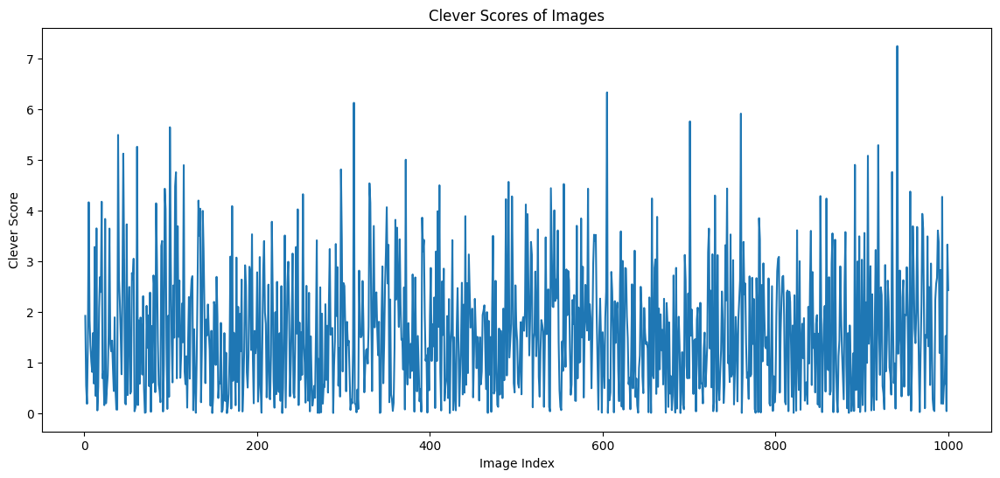

In [16]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))  # Adjust the figure size as per your preference

plt.plot(images, clever_scores)  # Customize the plot style if desired

plt.title("Clever Scores of Images")
plt.xlabel("Image Index")
plt.ylabel("Clever Score")